### Introduction
We are Spaghetti Analysis, and our goal for this project is to examine the impact of climate change on weather in the continental United States. Climate change from a human-caused rise in greenhouse gas emissions is increasing the frequency and intensity of extreme weather events (NASA, 2023) and our team aims to analyze, visualize, and demonstrate how extreme weather has changed over time. For our purposes weather means the combined state of the atmosphere for any given point in time. (Geo, n.d.) Extreme weather includes unexpected, unusual, severe, or unseasonal weather such as weather at the extremes of history. These extreme weather events have a real cost in lives and dollars, and understanding how the climate is developing over time is critical for many industries such as the energy and insurance sectors. The global insurer Munich Re estimates that natural disasters caused more than 90 billion in global direct losses in 2015 alone (Press, 2016). Extreme years such as 2005 (the year of Hurricane Katrina) have estimates of annual losses more than 200 billion USD (in 2010 dollars) ((NCEI), 2018). 
These extreme weather events have a real cost in lives and dollars, and understanding how the climate is developing over time is critical for many industries such as the energy and insurance sectors. The global insurer Munich Re estimates that natural disasters caused more than 90 billion in global direct losses in 2015 alone (Press, 2016). Extreme years such as 2005 (the year of Hurricane Katrina) have estimates of annual losses more than 200 billion USD (in 2010 dollars) ((NCEI), 2018). 

### Guiding Questions
Our team's analysis of the database will be steered by the following set of guiding questions:
•	How has the frequency of weather events changed over time in the last 50 years?
•	How has the severity of weather events changed over time in the last 50 years?
•	How has the size of weather events changed over time in the last 50 years?
•	How has the locations of extreme weather changed over the last 50 years? 
•	Which states have the highest frequencies of extreme weather?
•	Has the state with the highest frequency of extreme weather changed over the last 50 years?
•	Which states have the most severe weather?
•	Has the state with the most severe weather changed over the last 50 years?
•	Are there states whose climate was originally mild, but has changed to become more dangerous in the last 50 years?
•	Are certain classes of weather events becoming more common over the last 50 years?

Our team is to take the database and explore it with the goal of producing visualizations to highlight trends that will answer our guiding questions. Our strategy is to create the following visualizations:

Geospatial chloropleth maps will be used to answer the questions pertaining to how the weather has changed over time. The first map will be a chloropeth map of the USA with the number of weather events per state mapped to each state's geospatial data. 

### Dataset
The dataset used is the NCDC Storm Events Database (Administration, 2023), sourced from the National Oceanic and Atmospheric Administration (NOAA) of the United States Department of Commerce. The data contained within this database is provided by the National Weather Service (NWS) of the United States of America (USA). The data begins as early as 1950, through to the present, and is updated monthly. New events can be added with up to a 120-day delay, making this dataset up-to-date and relatively complete for even modern issues. 
The Storm Events Database contains data on various types of storms recorded by county. The database contains chronological listings by state of hurricanes, tornadoes, thunderstorms, hail, floods, drought conditions, lightning, high winds, snow, temperature extremes, and various other weather phenomena. 
The database is available as a combination of a Microsoft Access Database and Comma Separated Values files at the following URL:
https://www.ncdc.noaa.gov/stormevents/ftp.jsp

Every storm event has:

•	A unique ID and reference number for each weather event.

•	A beginning and ending date and time of the weather event

•	The county and state in which the event occurred.

•	The classification of the weather event, such as a storm, hail, or tornado.

•	The weather event’s originating and final location, azimuth, and direction.

•	The length, size, and magnitude of each weather event.

•	The damage caused by the event measured in both direct and indirect fatalities or injuries, and the total cost of property and crop damage in US dollars.

•	A brief description of each event. 

The NCDC Storm Events Database is provided as open data with no specific license attributed and is thus considered U.S. Government Work. U.S. Government Work is defined as “something created by a U.S. Government officer or employee as part of their official duties” (Government, 2023). Copyright permissions vary based upon the agency which the work originated from. In the case of the NCDC Storm Events Database, the data is provided free to use as an electronic download and the only usage constraints are that the original dataset must be cited when used as a source (NOAA, 2023). Additionally, the user must understand that while effort is made to use the best available information, time and resource constraints mean that some data within the dataset is unverified and any customer uses the information in the dataset at their own risk (NOAA, 2023). 

The dataset was downloaded in the form of the microsoft access database. The size of the database did cause some initial concern, as the University of Calgary's Data Science Hub only has 1GB of active memory for use, and the database exceeds that size. Working with the microsoft access database directly was slow and laborious due to the huge file size. While Pandas and Python can be set up to handle SQL databases, interfacing was too slow and thus the dataset was exported to CSV and imported via pandas' read_csv() function. Pandas is capable of loading the dataset within approximately 3.5 seconds. 

Mapping via GeoPandas requires a shapefile, which our team obtained from the United States Census Bureau. 

## Analysis
This analysis will be set up similair to a Q&A session, with a set of questions followed by a visualization to answer that question. 


Our first six guiding questions are as follows:

•	How has the frequency of weather events changed over time in the last 50 years?

•	How has the locations of extreme weather changed over the last 50 years? 

•	Has the state with the most severe weather changed over the last 50 years?

•	Are there states whose climate was originally mild, but has changed to become more dangerous in the last 50 years?

•	Which states have the highest frequencies of extreme weather?

•	Has the state with the highest frequency of extreme weather changed over the last 50 years?

•	Which states have the most severe weather?


To answer the above questions, we will use a geospatial chloropeth map with the color representing the number of severe weather events occurring for a given year. The database contains data from 1950 to 2012, and the map will be animated to cycle through each year in this range. 


The next guiding questions are: 

•	How has the size of weather events changed over time in the last 50 years?

•	How has the severity of weather events changed over time in the last 50 years

The size and severity of weather events will be plotted over time to answer these two guiding questions. Severity will be measured in the dollar value in property and crop damage, with injuries/fatalities ommitted so as to avoid the ethical question of converting human life to a dollar value.

The final guiding question is:

•	Are certain classes of weather events becoming more common over the last 50 years?

This final guiding question will be answered via breaking down the weather events by type and plotting them on a yearly basis. 


# step 1: Data Import and Data Cleaning
The database was initially available as a microsoft access database, however SQL queries and directly interfacing pandas with the microsoft access database was found to be very slow. As a workaround, the database was exported as CSV and reimported via Pandas' read_csv command. The following cell will import the required modules as well as download a shape file used to plot the geospatial data via GeoPandas.

In [30]:
import os
import wget
import math
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter
import matplotlib.colors as mcolors
from shapely.geometry import Polygon
print('Imported!')
# Download US shapefile
wget.download("https://www2.census.gov/geo/tiger/GENZ2018/shp/cb_2018_us_state_500k.zip")
print('Download Complete!')

Imported!
Download Complete!


In [31]:
%timeit stormdata = pd.read_csv('stormdata.csv')

<magic-timeit>:1: DtypeWarning: Columns (3,10,11,12,13,17,18,28,29,30,31,36) have mixed types. Specify dtype option on import or set low_memory=False.
<magic-timeit>:1: DtypeWarning: Columns (3,10,11,12,13,17,18,28,29,30,31,36) have mixed types. Specify dtype option on import or set low_memory=False.
<magic-timeit>:1: DtypeWarning: Columns (3,10,11,12,13,17,18,28,29,30,31,36) have mixed types. Specify dtype option on import or set low_memory=False.
<magic-timeit>:1: DtypeWarning: Columns (3,10,11,12,13,17,18,28,29,30,31,36) have mixed types. Specify dtype option on import or set low_memory=False.
<magic-timeit>:1: DtypeWarning: Columns (3,10,11,12,13,17,18,28,29,30,31,36) have mixed types. Specify dtype option on import or set low_memory=False.
<magic-timeit>:1: DtypeWarning: Columns (3,10,11,12,13,17,18,28,29,30,31,36) have mixed types. Specify dtype option on import or set low_memory=False.
<magic-timeit>:1: DtypeWarning: Columns (3,10,11,12,13,17,18,28,29,30,31,36) have mixed types.

3.75 s ± 23.2 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


The initial data cleaning in the following cells involves several major steps:

Step 1: Import the CSV file via pd.read_csv()

Step 2: Correct Dates

Step 3: Isolate required columns

Step 4: Correct Damage Exponents

Step 5: Group dataset by year and state and perform aggregate functions


In [32]:
# Parse database as CSV file
stormdata = pd.read_csv('stormdata.csv',parse_dates=[2],low_memory=False)
# python reads years after 2012 as 20XX instead of 19XX, use function to fix.
import datetime
def fix_date(x):
    if x.year > 2012:
        y = x - datetime.timedelta(days=365.25*100)
    else:
        y = x
    return y   
# keep only relevant columns for speed.
colstokeep = ['BGN_DATE','STATE','LATITUDE','LONGITUDE','EVTYPE','LENGTH','WIDTH','F','FATALITIES','INJURIES','PROPDMG','PROPDMGEXP','CROPDMG','CROPDMGEXP']
mappingdf = stormdata[colstokeep]
# apply date fix for dates after 2012 
mappingdf['BGN_DATE'] = mappingdf['BGN_DATE'].apply(fix_date)

# the following print can be used to double check the years are correct
#print(np.sort(mappingdf['BGN_DATE'].dt.year.unique()))

#add year column
mappingdf['YR'] = mappingdf['BGN_DATE'].dt.year
# group by year and state
yearlyevents = mappingdf.groupby(['YR','STATE']).count()
# produces multi indexed year, state, count.
# drop unnecessary columns, rename for clarity.
yearlyevents = yearlyevents.drop(columns=['LATITUDE','LONGITUDE','EVTYPE','LENGTH','WIDTH','F','FATALITIES','INJURIES','PROPDMG','PROPDMGEXP','CROPDMG','CROPDMGEXP']).rename(columns={'BGN_DATE': 'EVENTS'})
#print(yearlyevents)

# create function to be applied to exponent column to convert K and M suffixes to numerical value
def fix_exp(x):
    if x == 'K':
        y = 10**3
    if x == 'M':
        y = 10**6
    else:
        y = 0
    return y
# apply function along exponent columns.
mappingdf['PROPDMGEXP'] = mappingdf['PROPDMGEXP'].apply(fix_exp)
mappingdf['CROPDMGEXP'] = mappingdf['CROPDMGEXP'].apply(fix_exp)
# multiply PROPDMG by PROPDMGEXP, produce new column DMGTOT for the total damages in USD.
mappingdf['DMGTOT'] = mappingdf.PROPDMG*mappingdf.PROPDMGEXP + mappingdf.CROPDMG*mappingdf.CROPDMGEXP

# Create new dataframes for specific plots.
# drop unnecessary columns, group by year then state and sum
yearlysums = mappingdf.drop(columns=['BGN_DATE','LATITUDE','LONGITUDE','EVTYPE','LENGTH','WIDTH','F']).groupby(['YR','STATE']).sum()
# drop unnecessary columns
yearlysums = yearlysums.drop(columns=['PROPDMG','PROPDMGEXP','CROPDMG','CROPDMGEXP'])
                            #possibly use F scores to rate severity??
#print(yearlysums)
# also need a summation df
#yearlysums = mappingdf.drop(columns=['BGN_DATE']).groupby(['YR','STATE']).sum()
#print(yearlysums)
#print('eventtypes')
#eventtypes = mappingdf.groupby(['YR']).EVTYPE.value_counts()

# size over time plot
# isolate required columns
yearlysize = mappingdf.drop(columns=['STATE','BGN_DATE','LATITUDE','LONGITUDE','EVTYPE','F','FATALITIES','INJURIES','PROPDMG','PROPDMGEXP','CROPDMG','CROPDMGEXP','DMGTOT'])
# calculate area, accounting for units (length is in tenths of miles, width is in feet)
yearlysize['AREA'] = yearlysize.LENGTH*10*yearlysize.WIDTH/5280
# Group by Year and sum
yearlysize = yearlysize.groupby(['YR']).max()
# Isolate required columns for plotting.
yearlysize = yearlysize.drop(columns=['LENGTH','WIDTH'])

C:\Users\Sheldon\AppData\Local\Temp\ipykernel_5252\3285823415.py:2: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  stormdata = pd.read_csv('stormdata.csv',parse_dates=[2],low_memory=False)
C:\Users\Sheldon\AppData\Local\Temp\ipykernel_5252\3285823415.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mappingdf['BGN_DATE'] = mappingdf['BGN_DATE'].apply(fix_date)
C:\Users\Sheldon\AppData\Local\Temp\ipykernel_5252\3285823415.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentat

Our first guiding question:

•	How has the size of weather events changed over time in the last 50 years?

The only weather event class with a size measurement within the database are tornadoes, so to assess how the size of weather has changed, we will be examining tornado area over time. The data cleaning was already performed in the previous cell, so the result simply needs to be plotted. The plot consists of the maximum tornado size in square miles seen within each year.

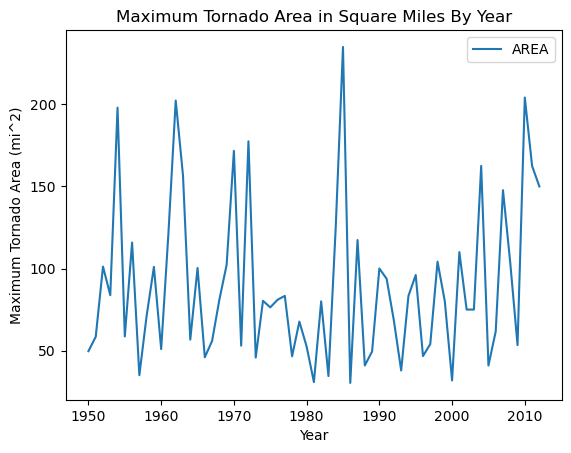

In [53]:
#print(yearlysize)
yearlysize.plot()
plt.title('Maximum Tornado Area in Square Miles By Year')
plt.xlabel('Year')
plt.ylabel('Maximum Tornado Area (mi^2)')
plt.savefig(os.getcwd()+'/plot/nongif/tornadoarea.png',dpi=400,bbox_inches='tight',transparent=False)

The next guiding question:

•	How has the severity of weather events changed over time in the last 50 years

This question will be answered via plotting the total damages in US Dollars over time, to visualize how severe weather has impacted society. The wrangling for this visualization has already been performed, so it simply must be plotted.

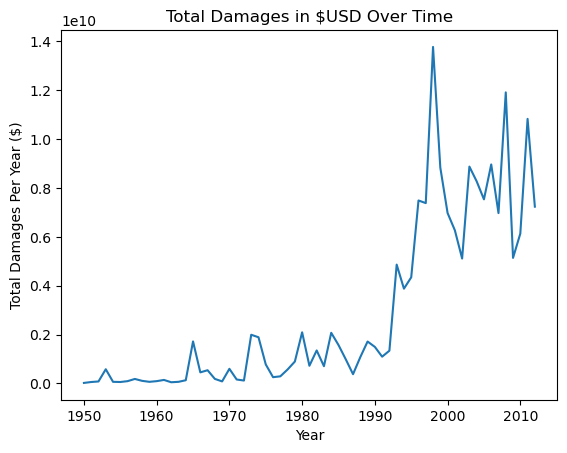

In [52]:
# make total damage over time plot
#print(yearlysums.DMGTOT)
#print(yearlysums.pivot(index='YR',columns='STATE'))
#print(yearlysums.unstack())
yearlysums.unstack().sum(axis=1).plot()
plt.title('Total Damages in $USD Over Time')
plt.xlabel('Year')
plt.ylabel('Total Damages Per Year ($)')
plt.savefig(os.getcwd()+'/plot/nongif/totdamage.png',dpi=400,bbox_inches='tight',transparent=False)

The next guiding question is:

•	Are certain classes of weather events becoming more common over the last 50 years?

To answer this question, weather events have been broken down by their event type and aggregated to visualize the total number of weather events of each class over time. There are 990 unique weather classifications within the dataset, with the majority only being tracked after 1993. The majority of these classifications are unique or have few entries due to being entered via human input and thus are subject to spelling mistakes and other errors. To compensate for this flaw in the dataset, event classifications with less than 5000 total occurrences within the 1950-2012 period are filtered out, as these events will barely register on the resulting visualization. Additionally, weather classifications with similair names will be combined into a single category, which significantly reduces clutter on the resulting visualization.

Step 1: Isolate required data columns from main dataframe to conserve memory.

Step 2: Rename similairly named weather classifications to have a single name.

Step 3: Pivot the dataframe based on event type by year, aggregating with value counts to count occurrences per event by year.

Step 4: Exclude event classifications with less than 4000 occurrences in 60 years. Goal is primarily to clean up the final plot by reducing the plotted variables. The filter of 4000 occurrences eliminates rare events and also events that are not consistently tracked throughout the dataset's timeline.

Step 5: Create and save the final plot.

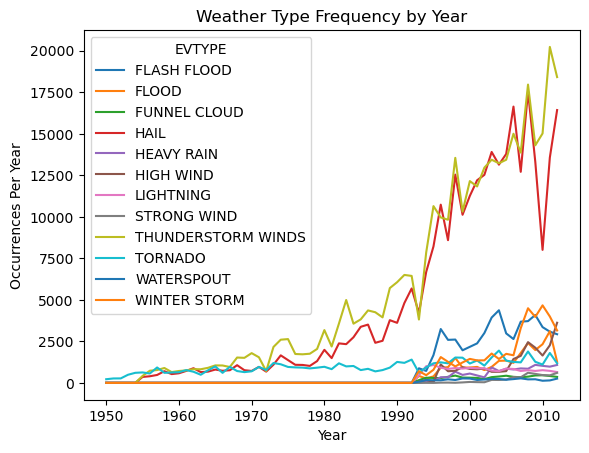

In [51]:
# Need # of event type occurrences per year
evtypes = mappingdf.drop(columns=['BGN_DATE','STATE','LATITUDE','LONGITUDE','LENGTH','WIDTH','F','FATALITIES','INJURIES','PROPDMG','PROPDMGEXP','CROPDMG','CROPDMGEXP','DMGTOT'])

#print(evtypes)
#print('pivot')
#print('')
# This works but there are 990 unique events
# Correct similairly named events to have the same classification
evtypes['EVTYPE'] = np.where(evtypes['EVTYPE'].isin(['THUNDERSTORM WIND']),'THUNDERSTORM WINDS',evtypes.EVTYPE)
evtypes['EVTYPE'] = np.where(evtypes['EVTYPE'].isin(['TSTM WIND']),'THUNDERSTORM WINDS',evtypes.EVTYPE)
evtypes['EVTYPE'] = np.where(evtypes['EVTYPE'].isin(['MARINE THUNDERSTORM WIND']),'THUNDERSTORM WINDS',evtypes.EVTYPE)
evtypes['EVTYPE'] = np.where(evtypes['EVTYPE'].isin(['MARINE TSTM WIND']),'THUNDERSTORM WINDS',evtypes.EVTYPE)
evtypes['EVTYPE'] = np.where(evtypes['EVTYPE'].isin(['WINTER WEATHER']),'WINTER STORM',evtypes.EVTYPE)
evtypes['EVTYPE'] = np.where(evtypes['EVTYPE'].isin(['WINTER WEATHER/MIX']),'WINTER STORM',evtypes.EVTYPE)
evtypes['EVTYPE'] = np.where(evtypes['EVTYPE'].isin(['HEAVY SNOW']),'BLIZZARD',evtypes.EVTYPE)
evtypes['EVTYPE'] = np.where(evtypes['EVTYPE'].isin(['BLIZZARD']),'WINTER STORM',evtypes.EVTYPE)
# Pivot dataset based on event type, spreading rows into columns and aggregating by value counts
evtypes = pd.pivot_table(evtypes,columns='EVTYPE',index='YR',aggfunc="value_counts",fill_value=0)

# Filter miscellaneous weather event types, dropping any classifications with less than 5000 total occurrences in 60 years.
# 5000 is an arbitrary value, chosen primarily to reduce clutter within the final plot.
evtypes = evtypes.drop(evtypes.columns[evtypes.sum().lt(4000)],axis=1)
# Create final plot.
evtypes.plot()
plt.title('Weather Type Frequency by Year')
plt.xlabel('Year')
plt.ylabel('Occurrences Per Year')
plt.savefig(os.getcwd()+'/plot/nongif/weatherclass.png',dpi=400,bbox_inches='tight',transparent=False)

The final group of guiding questions are as follows:

•	How has the frequency of weather events changed over time in the last 50 years?

•	How has the locations of extreme weather changed over the last 50 years? 

•	Has the state with the most severe weather changed over the last 50 years?

•	Are there states whose climate was originally mild, but has changed to become more dangerous in the last 50 years?

•	Which states have the highest frequencies of extreme weather?

•	Has the state with the highest frequency of extreme weather changed over the last 50 years?

•	Which states have the most severe weather?

All of these questions can be answered with a single visualization to display the count of severe weather by state per year.

Each map has several steps required to create it:

Step 1: Isolate the dataset for the particular year of interest.

Step 2: Reindex the dataset using a master list of state codes so that states with no records will have a zero entry.

Step 3: Remove the residual multiindex and rename columns for ease of use.

Step 4: Parse shape file of the USA and merge the GeoDataFrame with the dataframe of number of events per state.

Step 4: Convert event count into a normalized color map, using MatPlotLib's YellowOrangeBrown color scheme.

Step 5: Read the world map from GeoPandas' built-in dataset and project the USA shape file via the Mercator Projection.

Step 6: Create and set up figures, titles, color bar legend, and color scale. 

Step 7: Add annotation with reference information and access date.

Step 8: Loop through all states in the GeoDataFrame and render each one sequentially. This approach preserves accurate color mapping.

Step 9: Force axis limits to ensure consistent plotting scales, else some years will plot distorted.

Step 10: Create minor subplots to show Alaska and Hawaii on the same map.

Step 11: Save resulting map to current working directory in a plot folder.

Step 12: Repeat steps 1-11 for all years within the dataset to compile a portfolio of chloropeth maps for the database's timeline.
 
Step 13: Parse compiled chloropeth map PNG files into a GIF using imageiov2. 

C:\Users\Sheldon\AppData\Local\Temp\ipykernel_5252\1628849027.py:37: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))
C:\Users\Sheldon\AppData\Local\Temp\ipykernel_5252\1628849027.py:37: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))
C:\Users\Sheldon\AppData\Local\Temp\ipykernel_5252\1628849027.py:37: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vec

Plot Printing Complete!


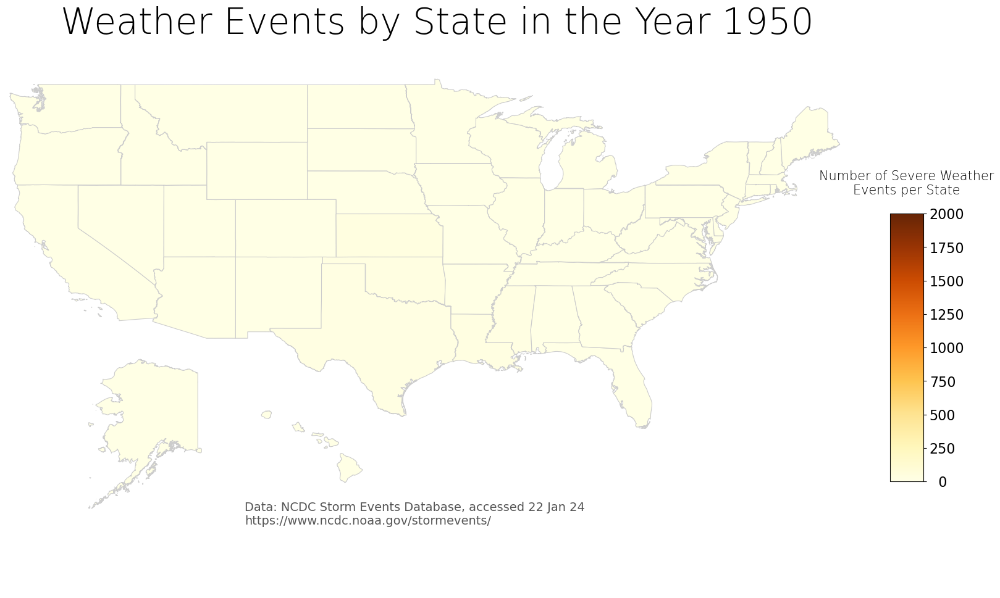

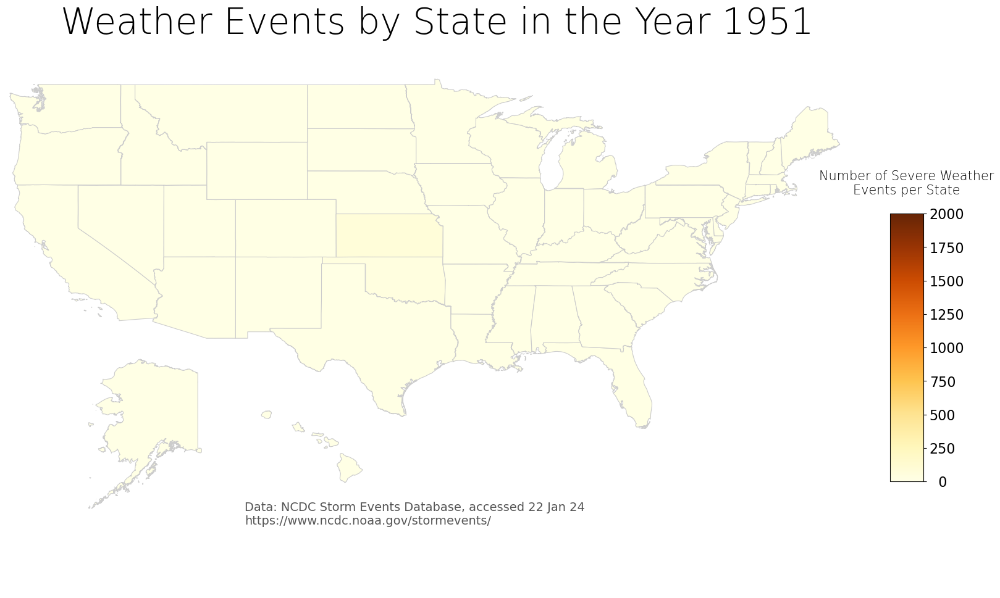

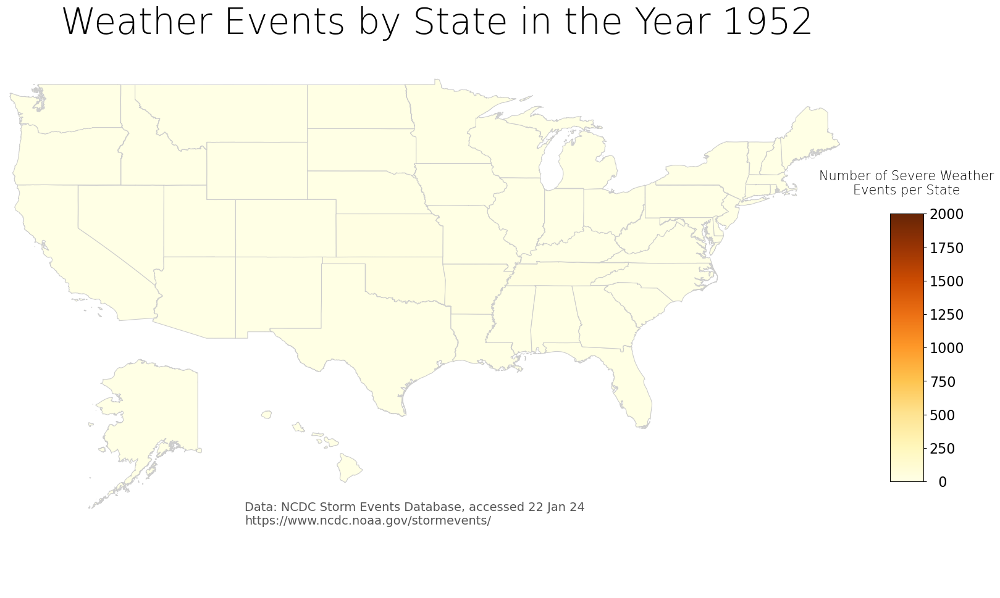

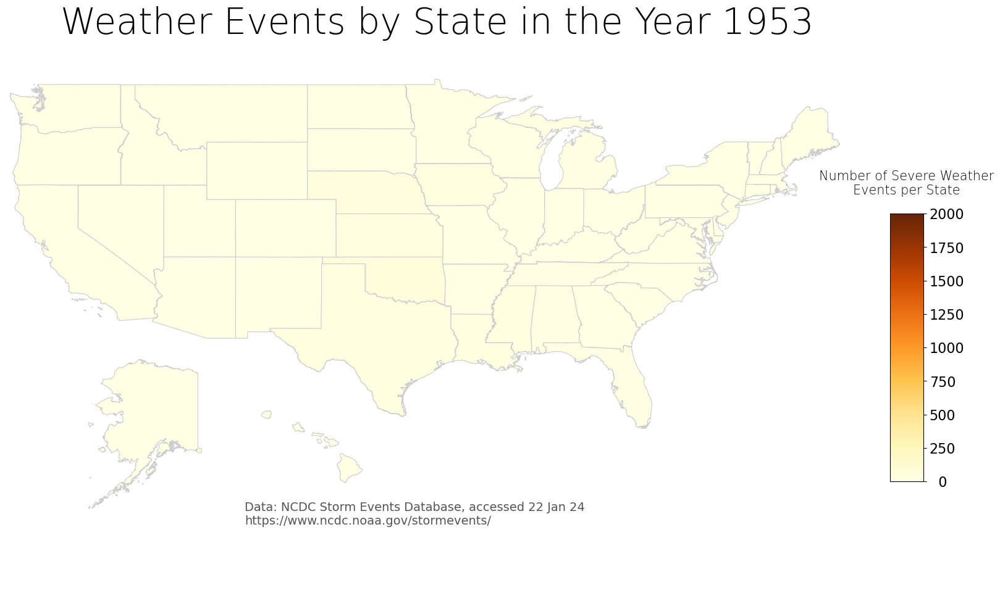

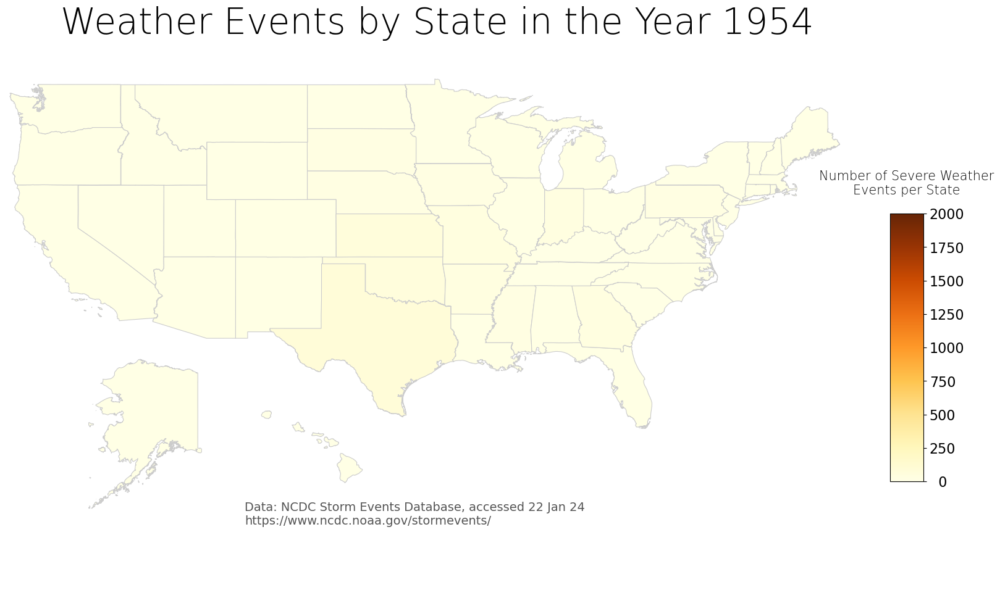

...

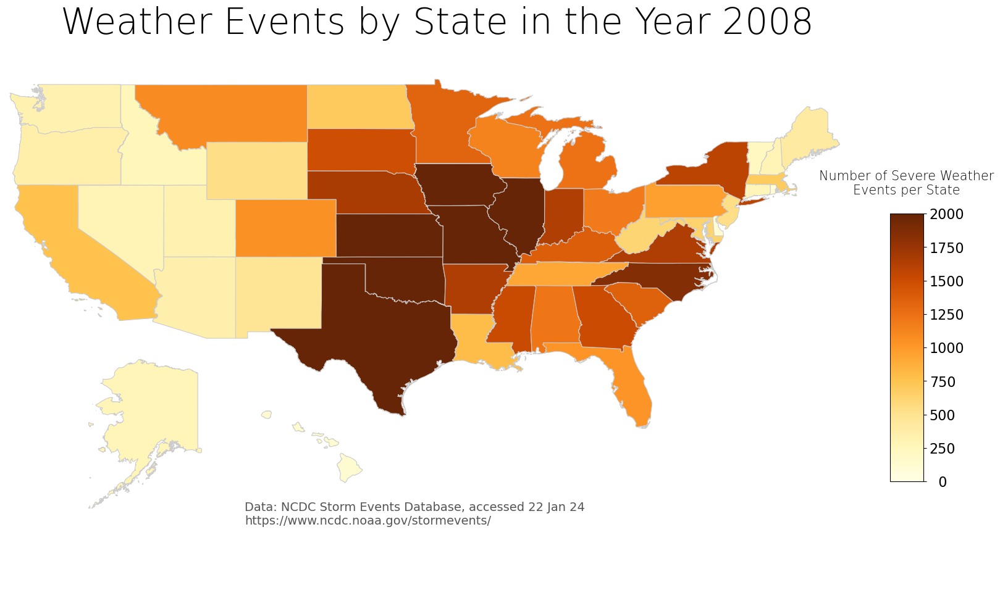

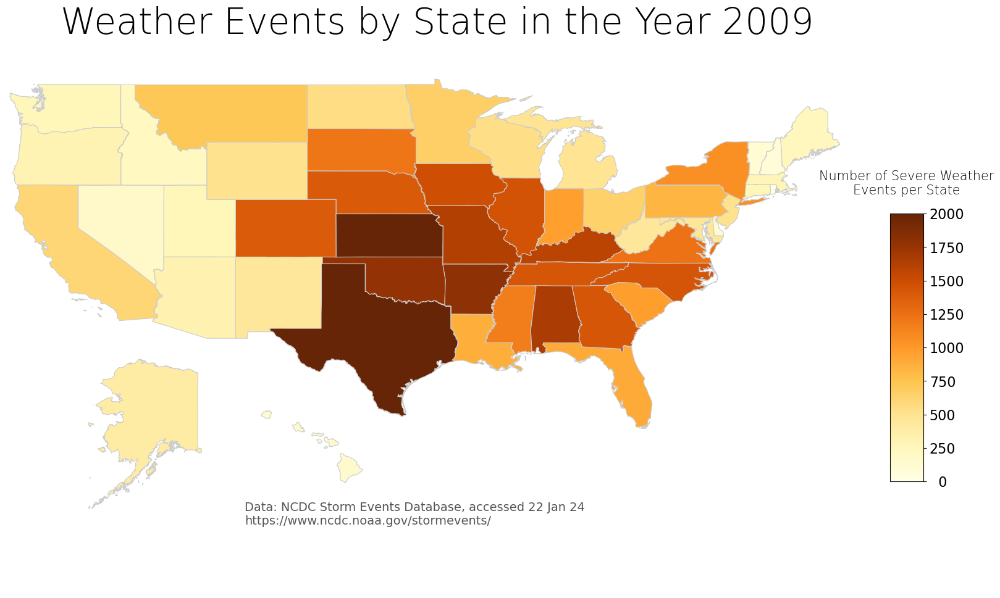

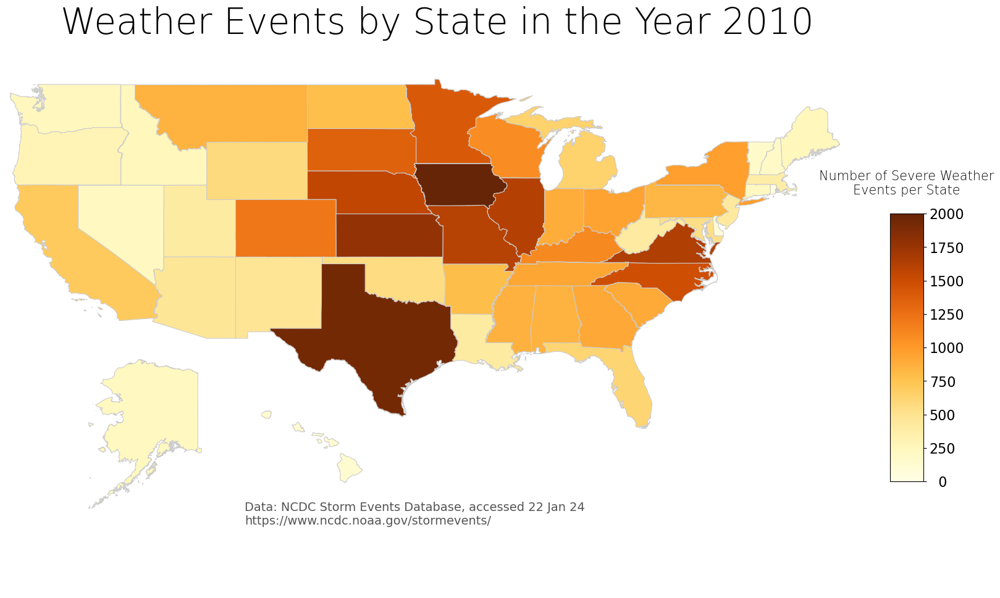

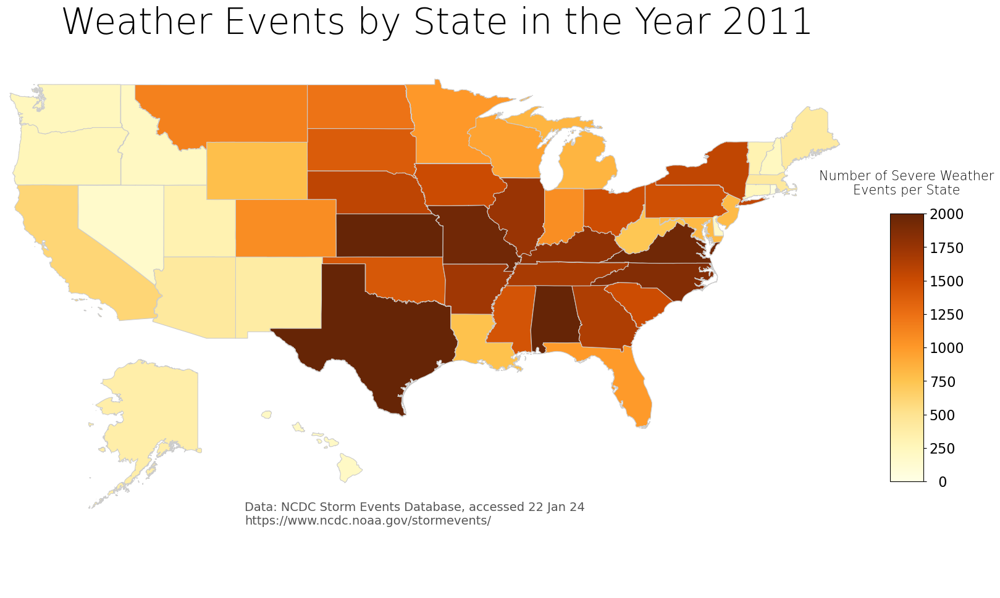

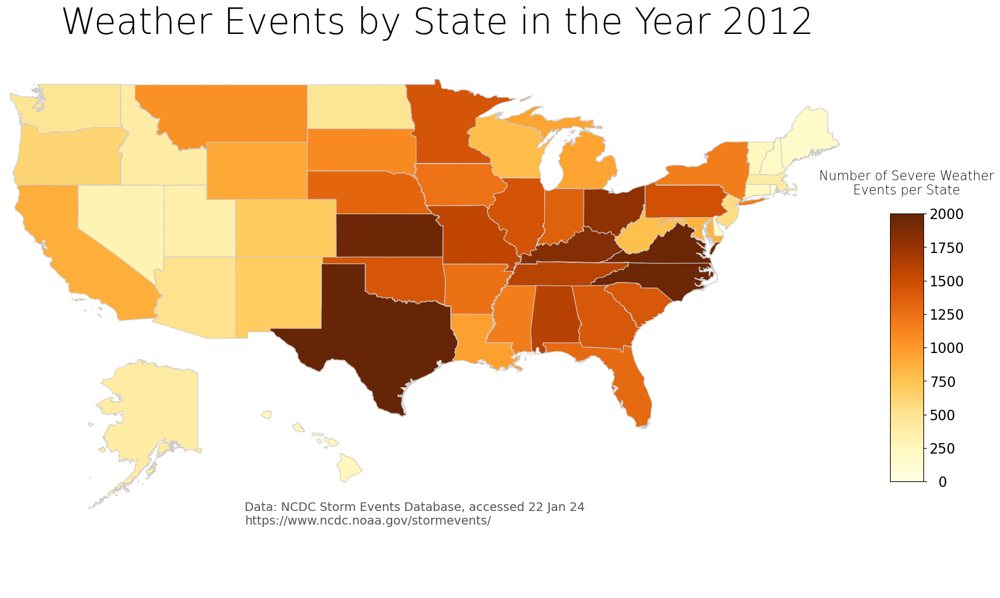

In [41]:
# This cell is for the creation of PNG maps to be folded into a GIF.
# list of all states to be used as index
states = ['AK', 'AL', 'AM', 'AN', 'AR', 'AZ', 'CA', 'CO', 'CT', 'DC', 'DE', 'FL', 'GA', 'GM', 'HI', 'IA', 'ID', 'IL', 'IN', 'KS', 'KY', 'LA', 'LC', 'LE', 'LH', 'LM', 'LO', 'LS', 'MA', 'MD', 'ME', 'MI', 'MN', 'MO', 'MS', 'MT', 'NC', 'ND', 'NE', 'NH', 'NJ', 'NM', 'NV', 'NY', 'OH', 'OK', 'OR', 'PA', 'PH', 'PK', 'PM', 'PR', 'PS', 'PZ', 'RI', 'SC', 'SD', 'TN', 'TX', 'UT', 'VA', 'VI', 'VT', 'WA', 'WI', 'WV', 'WY', 'XX']

# Wrap map creation in a loop so as to create one map per year within the dataset.
for year in np.sort(mappingdf['BGN_DATE'].dt.year.unique()):
    
    #isolate dataset for particular year of interest
    eventsperstate = yearlyevents.loc[year]
    #Reindex with list of all states so that states with no records are still rendered. Fill NaNs with 0.
    eventsperstate = eventsperstate.reindex(states).fillna(0)
    #remove multi index, rename to lowercase
    eventsperstate = eventsperstate.reset_index().rename(columns={'STATE': 'state','EVENTS': 'events'})
    

    
    #read shapefile, shapefiles are a standard format for geospatial data and can be pulled from open source libraries
    gdf = gpd.read_file(os.getcwd()+'/cb_2018_us_state_500k')
    # merge with eventsperstate by STATE column
    gdf = gdf.merge(eventsperstate,left_on='STUSPS',right_on='state')
    # gdf file now has an "events" column
    # convert event count to color column
    # Apply this to the gdf to ensure all states are assigned colors by the same func
    #min and max, to get from overall data
    vmin,vmax = 0,2000
    variable = 'events'
    colormap = plt.cm.YlOrBr
    def makeColorColumn(gdf,variable,vmin,vmax):
        # apply a function to a column to create a new column of assigned colors & return full frame
        norm = mcolors.Normalize(vmin=vmin, vmax=vmax, clip=True)
        mapper = plt.cm.ScalarMappable(norm=norm, cmap=colormap)
        gdf['value_determined_color'] = gdf[variable].apply(lambda x: mcolors.to_hex(mapper.to_rgba(x)))
        return gdf
    gdf = makeColorColumn(gdf,variable,vmin,vmax)
    
    #obtain world 
    world = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))
    # use mercator projection, espg 3857
    visframe = gdf.set_crs(3857,allow_override=True)
    # initialize fig and plot
    fig,ax = plt.subplots(1, figsize=(18,14))
    plt.autoscale(enable=True,tight=True)
    ax.axis('off')
    
    #add title
    ax.set_title('Weather Events by State in the Year %i' % year,fontdict={'fontsize':'42','fontweight':'1'})
    #create colorbar legend
    fig = ax.get_figure()
    # add colorbar axes to figure
    # [left,bottom,width,height] in normalized units (0-1)
    cbax = fig.add_axes([0.92,0.21,0.03,0.31])
    cbax.set_title('Number of Severe Weather\nEvents per State\n', fontdict={'fontsize': '15', 'fontweight' : '0'})
    
    # add color scale
    sm = plt.cm.ScalarMappable(cmap=colormap, \
                     norm=plt.Normalize(vmin=vmin, vmax=vmax))
    # reformat tick labels on legend
    sm._A = []
    comma_fmt = FuncFormatter(lambda x, p: format(x, '3.0f'))
    fig.colorbar(sm, cax=cbax, format=comma_fmt,fraction=0.046,pad=0.04)
    tick_font_size = 16
    cbax.tick_params(labelsize=tick_font_size)
    # annotate the data source, date of access, and hyperlink
    ax.annotate("Data: NCDC Storm Events Database, accessed 22 Jan 24\nhttps://www.ncdc.noaa.gov/stormevents/", xy=(0.22, .085), xycoords='figure fraction', fontsize=14, color='#555555')
    
    # MAP CREATION
    # Note: we're going state by state here because of unusual coloring behavior when trying to plot the entire dataframe 
    # using the "value_determined_color" column
    #for mapping entire dataframe use:
    #visframe[~visframe.state.isin(['HI','AK'])].plot(color='lightblue', linewidth=0.8, ax=ax, edgecolor='0.8')
    #stored polygon for clipping continental USA
    #poly = Polygon([(-130,25),(-130,60),(-60,60),(-60,25)])
    for row in visframe.itertuples():
        if row.state not in ['AK','HI']:
            vf = visframe[visframe.state==row.state]
            c = gdf[gdf.state==row.state][0:1].value_determined_color.item()
            vf.plot(color=c, linewidth=0.8, ax=ax, edgecolor='0.8',aspect=1,missing_kwds={'color': 'lightgrey',
                                                                                          'edgecolor': 'red',
                                                                                          'hatch': '///',
                                                                                          'label': 'Missing Values'})
    # Force axis limits to ensure consistent plotting
    ax.set_xlim(-125,-65)
    ax.set_ylim(25,52)
    
    # add Alaska
    akax = fig.add_axes([0.15, 0.17, 0.2, 0.19])   
    akax.axis('off')
    # polygon to clip western islands
    polygon = Polygon([(-170,50),(-170,72),(-140, 72),(-140,50)])
    alaska_gdf = gdf[gdf.state=='AK']
    #detect if a state is empty
    if not alaska_gdf.empty:
        alaska_gdf.clip(polygon).plot(color=gdf[gdf.state=='AK'].value_determined_color, linewidth=0.8,ax=akax, edgecolor='0.8',
                                                                                          missing_kwds={'color': 'lightgrey',
                                                                                          'edgecolor': 'red',
                                                                                          'hatch': '///',
                                                                                          'label': 'Missing Values'})
    else:
        alaska_gdf.clip(polygon).plot(color='#ffffe5', linewidth=0.8,ax=akax, edgecolor='0.8',aspect=1)
    
    
    # add Hawaii
    hiax = fig.add_axes([.35, 0.20, 0.1, 0.1])   
    hiax.axis('off')
    # polygon to clip western islands
    hipolygon = Polygon([(-160,0),(-160,90),(-120,90),(-120,0)])
    hawaii_gdf = gdf[gdf.state=='HI']
    if not hawaii_gdf.empty:
        hawaii_gdf.clip(hipolygon).plot(color=hawaii_gdf['value_determined_color'], linewidth=0.8,ax=hiax, edgecolor='0.8',
                                                                                        missing_kwds={'color': 'lightgrey',
                                                                                          'edgecolor': 'red',
                                                                                          'hatch': '///',
                                                                                          'label': 'Missing Values'})
    else:
        hawaii_gdf.clip(hipolygon).plot(color='#ffffe5', linewidth=0.8,ax=hiax, edgecolor='0.8',aspect=1)
    
    
    # Save plot to working directory
    fig.savefig(os.getcwd()+'/plot/frequency'+str(year)+'.png',dpi=400,bbox_inches='tight',transparent=False)
print('Plot Printing Complete!')
# Utilized tutorial on using GeoPandas to create chloropeth maps found here:
# https://medium.com/@alex_44314/use-python-geopandas-to-make-a-us-map-with-alaska-and-hawaii-39a9f5c222c6

In [42]:
# This cell will use imageio to compile all the PNG files into a single GIF.
import imageio.v2 as imageio
#filepath setup
folder = os.getcwd()+'\plot'
# acquire list of png files
pngs = [f for f in os.listdir(folder) if f.endswith('png')]
#sort to ensure they are in the correct order
pngs.sort()

#create a list for storing images
images = []
for png in pngs:
    filepath = os.path.join(folder,png)
    images.append(imageio.imread(filepath))
# set path for output gif
output_gif = os.getcwd()+'\plot\output\output.gif'
imageio.mimsave(output_gif,images,fps=3,disposal=2,loop=0)
print('Output Complete!')

Output Complete!


# CONCLUSIONS

There are flaws in the dataset, most notably that reporting standards have changed over the duration of the database's existence. From 1950 to 1995 the database exclusively consisted of tornado, thunderstorm, and hail data from the National Weather Service's Storm Prediction Center. From 1996 to 2006, data was entered by the National Weather Service Forecast Office Warning Coordination Meteorologist, including latitude and longitude and significantly more classifications of weather events. From 2006 to the current day, the precision and accuracy of the reporting was increased, with the capability to report start and end positions to within 5-10 meters (decimal degrees to the ten thousandths). 

Questions:
•	How has the frequency of weather events changed over time in the last 50 years?
 - The frequency of severe weather events has increased over time. The number of occurrences per year within the database increases rapidly as the years progress. Notably, in 1993 the database reporting standards changed, and a significant number of event classifications and data per event begins. This results in an explosion of various weather types after 1993, which is visible within all visualizations presented within this project. 


•	How has the severity of weather events changed over time in the last 50 years?
 - The total damage per year caused by weather events has increased over time. Correlating with the frequency of severe weather increasing per year, so too has the severity measured in USD damage costs. 


•	How has the size of weather events changed over time in the last 50 years?
 - The maximum size of tornadoes seen within each year in square miles has not significantly varied over the last 50 years. As seen in the plot of tornado area over time, certain years have outstandingly large tornadoes, but overall the majority of years only see a maximum tornado size of approximately 100 square miles or less. 


•	How has the locations of extreme weather changed over the last 50 years?
 - The location of severe weather has varied, with the overall trend showing more areas becoming subject to devastation from weather events. Our map shows that severe weather has moved north and east from Texas to encompass almost the entire continental USA. 


•	Which states have the highest frequencies of extreme weather?
- Texas stands out as a state with a high frequency of extreme weather. The Central States consisting of North and South Dakota, Nebraska, Kansas, Oklahoma, Texas, Minnesota, Iowa, Missouri, Arkansas, Louisiana, Wisconsin, Illinois, Michigan, Indiana, Ohio, Kentucky, Tennessee, West Virginia, Mississippi, and Alabama show high levels of severe weather activity. Kansas and Oklahoma stand out as states with very high frequencies of severe weather.


•	Has the state with the highest frequency of extreme weather changed over the last 50 years?
- Yes and no, Texas stands out as an outlier with abnormally extreme weather, and Texas maintains that lead into the modern era.


•	Which states have the most severe weather?
- Generally the south/central/eastern states along have the most severe weather.


•	Has the state with the most severe weather changed over the last 50 years?
 - Texas maintains a status as a state with consistently severe weather, and it's not until the later years within the dataset that other states begin to match the level of severe weather in Texas. Kansas, Oklahoma, and other states within Tornado Alley also begin to match the severity of weather within Texas by 2012.

•	Are there states whose climate was originally mild, but has changed to become more dangerous in the last 50 years?
- Initially, severe weather seems confined to east of the Rocky Mountain range, however as the years pass, even western states such as California become subject to increasing levels of sever weather. In 1950, California exhibits almost no severe weather, but by 2012 it has been subjected to over a thousand severe weather events in a year. 


•	Are certain classes of weather events becoming more common over the last 50 years?
- Severe weather of all types is becoming more common over the years, but flooding, hail, and thunderstorms are becoming more common. Of note is that flooding in particular has greatly increased since 2005, which is notable because flooding was not tracked until 1993.



Overall, this project has been a fantastic learning tool for data analysis with Python 3. The data cleaning and wrangling involved in this project has given us a very well developed Numpy and Pandas skillset, as well as experience creating unique and captivating visuals for an audience. The activities involved within this project closely mirror one of our team member's experience as an EIT intern, further reinforcing how this project has acted as a training tool for our skillsets. 

A major insight we have gained from analyzing this weather dataset is an appreciation for how significant of an impact climate change and global warming has had on the weather within the last half century. The damage to life and property from severe weather is increasing with every passing year, sometimes at incredible rates. 

Following along this insight, modeling using this dataset could be used to predict the occcurrences of severe weather in the future. Exploration into  relationships such as the mean time between severe weather events and how the time between events influences the severity of the resulting event could be insightful. A useful goal for this data exploration would be accurate prediction of when severe weather will occur, however that goal will likely require meteorological data alongside each weather event. Machine learning could also be utilized upon the dataset to find trends and relationships that are not easily visualized and thus discovered by humans. 


#References

(NCEI), N. C. f. E. I., 2018. Billion-Dollar Weather and Climate Disasters Summary Stats. [Online] 
Available at: https://www.ncei.noaa.gov/access/billions/summary-stats
[Accessed 22 January 2024].

Administration, N. O. a. A., 2023. NCDC Storm Events Database. [Online] 
Available at: https://catalog.data.gov/dataset/ncdc-storm-events-database2
Geo, N., n.d. National Geographic Weather Collection. [Online] 
Available at: https://education.nationalgeographic.org/resource/resource-library-weather/
[Accessed 22 January 2024].

Government, U. S., 2023. USA Government Work Copyright Information. [Online] 
Available at: https://www.usa.gov/government-copyright
[Accessed 22 January 2024].

NASA, 2023. NASA Global Climate Change. [Online] 
Available at: https://climate.nasa.gov/extreme-weather/
[Accessed 22 January 2024].

NOAA, 2023. National Centers for Environmental Information. [Online] 
Available at: https://www.ncei.noaa.gov/metadata/geoportal/rest/metadata/item/gov.noaa.ncdc:C00510/html
[Accessed 22 January 2024].

Press, N. A., 2016. Attribution of Extreme Weather Events in the Context of Climate Change (Report). ISBN 978-0-309-38094-2, N/A(N/A), pp. 21-24.

